In [99]:
import os
import pickle
import numpy as np
from tqdm.notebook import tqdm

from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add, Bidirectional

In [100]:
BASE_DIR = "C:/Users/hp/Downloads/archivenlp"
WORKING_DIR = "C:/Users/hp/Downloads/New WinRAR archive/laksh"

In [101]:
# load vgg16 model
model = VGG16()
# restructure the model
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
# summarize
print(model.summary())

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [102]:
# Load features
features = np.load(WORKING_DIR + '/features.pkl', allow_pickle=True)

In [103]:
with open(os.path.join(BASE_DIR, 'captions.txt'), 'r') as f:
    next(f)
    captions_doc = f.read()

In [136]:
captions_doc

'1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .\n1000268201_693b08cb0e.jpg,A girl going into a wooden building .\n1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .\n1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .\n1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .\n1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting\n1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with each other on the road .\n1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots are staring at each other in the street .\n1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each other on the road .\n1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .\n1002674143_1b742ab4b8.jpg,A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .\n1002674143_1b742ab4b8.j

In [104]:
# create mapping of image to captions
mapping = {}
# process lines
for line in tqdm(captions_doc.split('\n')):
    # split the line by comma(,)
    tokens = line.split(',')
    if len(line) < 2:
        continue
    image_id, caption = tokens[0], tokens[1:]
    # remove extension from image ID
    image_id = image_id.split('.')[0]
    # convert caption list to string
    caption = " ".join(caption)
    # create list if needed
    if image_id not in mapping:
        mapping[image_id] = []
    # store the caption
    mapping[image_id].append(caption)

  0%|          | 0/40456 [00:00<?, ?it/s]

In [135]:
mapping

{'1000268201_693b08cb0e': ['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
  'startseq girl going into wooden building endseq',
  'startseq little girl climbing into wooden playhouse endseq',
  'startseq little girl climbing the stairs to her playhouse endseq',
  'startseq little girl in pink dress going into wooden cabin endseq'],
 '1001773457_577c3a7d70': ['startseq black dog and spotted dog are fighting endseq',
  'startseq black dog and tri-colored dog playing with each other on the road endseq',
  'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
  'startseq two dogs of different breeds looking at each other on the road endseq',
  'startseq two dogs on pavement moving toward each other endseq'],
 '1002674143_1b742ab4b8': ['startseq little girl covered in paint sits in front of painted rainbow with her hands in bowl endseq',
  'startseq little girl is sitting in front of large painted rainbow ends

In [105]:
len(mapping)

8091

In [106]:
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            # take one caption at a time
            caption = captions[i]
            # preprocessing steps
            # convert to lowercase
            caption = caption.lower()
            # delete digits, special chars, etc., 
            caption = caption.replace('[^A-Za-z]', '')
            # delete additional spaces
            caption = caption.replace('\s+', ' ')
            # add start and end tags to the caption
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>1]) + ' endseq'
            captions[i] = caption
            

In [107]:
# before preprocess of text
mapping['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [108]:
# preprocess the text
clean(mapping)

In [109]:
# after preprocess of text
mapping['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

In [110]:
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

In [111]:
len(all_captions)

40455

In [112]:
# tokenize the text
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index) + 1

In [113]:
vocab_size

8485

In [114]:
# get maximum length of the caption available
max_length = max(len(caption.split()) for caption in all_captions)
max_length

35

In [115]:
import keras
import numpy as np

# Load pre-trained model
model = keras.models.load_model(WORKING_DIR + '/my_model.h5')

In [117]:
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None


In [71]:
from PIL import Image, ImageDraw, ImageFont

# define braille characters and corresponding Unicode values
BRAILLE_CHARS = {' ': '\u2800', '\u0041': '\u1F100', '\u0042': '\u1F101', '\u0043': '\u1F102', '\u0044': '\u1F103',
                 '\u0045': '\u1F104', '\u0046': '\u1F105', '\u0047': '\u1F106', '\u0048': '\u1F107', '\u0049': '\u1F108',
                 '\u004A': '\u1F109', '\u004B': '\u1F10A', '\u004C': '\u1F10B', '\u004D': '\u1F10C', '\u004E': '\u1F10D',
                 '\u004F': '\u1F10E', '\u0050': '\u1F10F', '\u0051': '\u1F110', '\u0052': '\u1F111', '\u0053': '\u1F112',
                 '\u0054': '\u1F113', '\u0055': '\u1F114', '\u0056': '\u1F115', '\u0057': '\u1F116', '\u0058': '\u1F117',
                 '\u0059': '\u1F118', '\u005A': '\u1F119'}
# define image dimensions and other constants
CELL_WIDTH = 10
CELL_HEIGHT = 20
MARGIN = 10
DOT_RADIUS = 2

# create a new image and a draw object
def text_to_braille(y_pred):
    # remove start and end sequence tokens from y_pred
    y_pred = y_pred.replace('startseq', '').replace('endseq', '')
    
    # create a new image and a draw object
    num_cells = len(y_pred)
    img_width = num_cells * CELL_WIDTH + MARGIN * 2
    img_height = CELL_HEIGHT + MARGIN * 2
    img = Image.new('RGB', (img_width, img_height), color=(255, 255, 255))
    draw = ImageDraw.Draw(img)

    # set up font for braille characters
    font = ImageFont.truetype('ArialTh.ttf', size=16)

    # draw braille cells for each character in y_pred
    for i in range(num_cells):
        char = y_pred[i]
        if char in BRAILLE_CHARS:
            braille_char = BRAILLE_CHARS[char]
            x = MARGIN + i * CELL_WIDTH
            y = MARGIN
            draw.text((x, y), braille_char, font=font, fill=(0, 0, 0))

            # draw dots for each raised braille dot
            for j in range(6):
                if len(braille_char) >= j+1 and braille_char[j] == '\u2800':
        # dot not raised
                    fill_color = (255, 255, 255)
                else:
                    # dot raised
                    fill_color = (0, 0, 0)
                cx = x + (j % 2) * CELL_WIDTH / 2 + CELL_WIDTH / 4
                cy = y + (j // 2) * CELL_HEIGHT / 3 + CELL_HEIGHT / 6
                draw.ellipse((cx - DOT_RADIUS, cy - DOT_RADIUS, cx + DOT_RADIUS, cy + DOT_RADIUS), fill=fill_color)

    # show the image
    img.show()

In [125]:
from sklearn.cluster import KMeans
def predict_caption(model, image, tokenizer, max_length):
    # add start tag for generation process
    in_text = 'startseq'
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([image, sequence], verbose=0)
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        word = idx_to_word(yhat, tokenizer)
        # stop if word not found
        if word is None:
            break
        # append word as input for generating next word
        in_text += " " + word
        # stop if we reach end tag
        if word == 'endseq':
            break
      
    return in_text

In [126]:
from PIL import Image
import matplotlib.pyplot as plt
import pyttsx3
from IPython.display import Audio
def generate_caption(image_name):
    # load the image
    # image_name = "1001773457_577c3a7d70.jpg"
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "Images", image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('---------------------Actual---------------------')
    for caption in captions:
        print(caption)
    # predict the caption
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print('--------------------Predicted--------------------')
    print(y_pred)
    text = ' '.join(y_pred.split()[1:-1])
    # Set up the pyttsx3 TTS engine
    engine = pyttsx3.init()
    engine.setProperty('voice', 'en-us')

    # Synthesize the audio and play it in the notebook
    engine.save_to_file(text, 'output.mp3')
    engine.runAndWait()
    display(Audio("output.mp3", autoplay=True))
    plt.imshow(image)
    text_to_braille(y_pred)
    

---------------------Actual---------------------
startseq girl in red t-shirt is sitting on rock above the clouds endseq
startseq girl sits on the side of large mountain with one leg hanging off endseq
startseq woman in red shirt is sitting on the edge of cliff endseq
startseq woman in red is sitting on the edge of steep rock endseq
startseq woman in red shirt is sitting on the edge of high cliff endseq
--------------------Predicted--------------------
startseq man in red shirt is climbing rock wall endseq


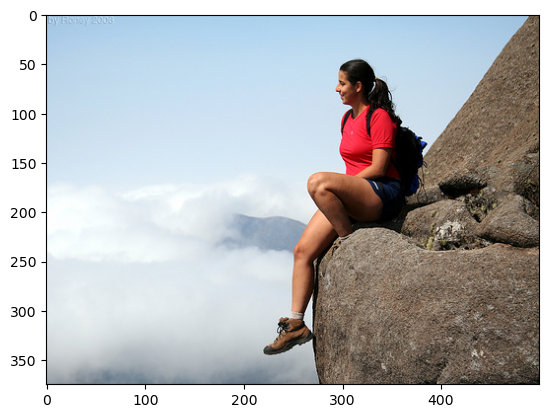

In [127]:
generate_caption("248174959_2522871152.jpg")

---------------------Actual---------------------
startseq brown dog is panting hard on grass during sunny day endseq
startseq brown dog walks in the grass with its tongue hanging out endseq
startseq dog running with tongue hanging out endseq
startseq "a grey dog walks in the green grass tongue hanging out ." endseq
startseq tan dog jogging with his tongue hanging out endseq
--------------------Predicted--------------------
startseq brown dog with blue collar is panting on the grass endseq


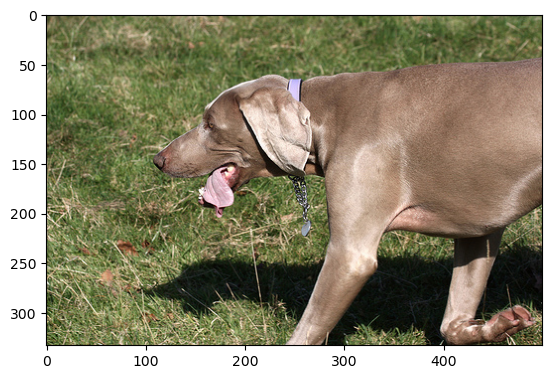

In [128]:
generate_caption("1659358141_0433c9bf99.jpg")

---------------------Actual---------------------
startseq "a crowd wearing red cheers on the red football team ." endseq
startseq football players in red congratulate each other as crowds in red cheer behind endseq
startseq the oklahoma sooners football team discuss their game while fans cheer endseq
startseq two football players talk during game endseq
startseq two oklahoma sooner football players talk on the sideline endseq
--------------------Predicted--------------------
startseq the football player in red and white is wearing red and white and white red and white red and white red and white red and white red and white red and white red and white


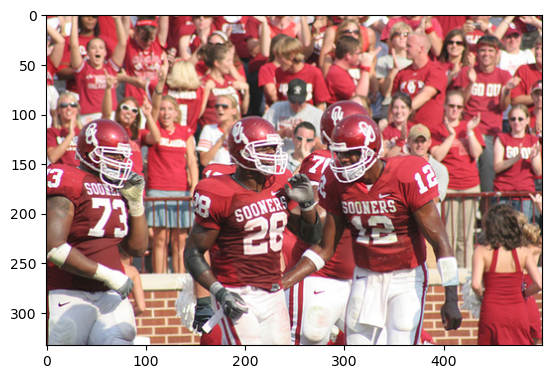

In [95]:
generate_caption("241345596_91e0e2daf5.jpg")

---------------------Actual---------------------
startseq boy bounces in an inflatable playhouse endseq
startseq boy in blue shirt plays in jumping tent endseq
startseq boy jumping in moonwalk endseq
startseq kid takes flight inside multicolored balloon bounce house endseq
startseq young boy jumping in jumping castle endseq
--------------------Predicted--------------------
startseq girl in red shirt jumped on red arms in front of red bounce endseq


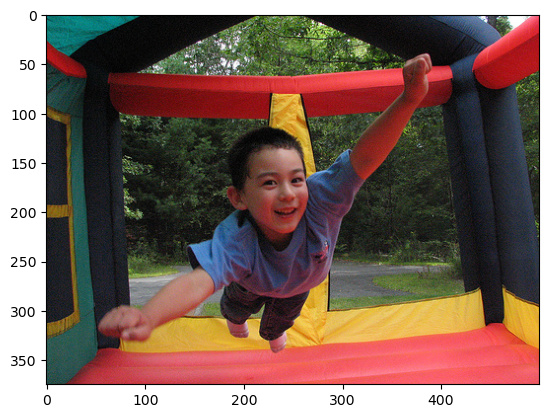

In [98]:
generate_caption("242109387_e497277e07.jpg")

In [126]:
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
    # load the image
    # image_name = "1001773457_577c3a7d70.jpg"
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "Images", image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('---------------------Actual---------------------')
    for caption in captions:
        print(caption)
    # predict the caption
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print('--------------------Predicted--------------------')
    print(y_pred)
    plt.imshow(image)

In [144]:
import nltk
from nltk.translate.bleu_score import corpus_bleu

def evaluate(model, dataset, tokenizer, max_length):
    
    references = []
    predictions = []
    
    # iterate over the dataset
    for image in dataset:
        # generate caption
        predicted_caption = predict_caption(model, image, tokenizer, max_length)
        # convert integer sequence to text
        predicted_caption = tokenizer.sequences_to_texts([predicted_caption])[0].split()
        # remove start and end tags
        predicted_caption = predicted_caption[1:-1]
        # convert ground truth caption to list of words
        caption = caption.split()
        # append references and predictions
        references.append([caption])
        predictions.append(predicted_caption)
    # calculate BLEU score
    bleu_score = corpus_bleu(references, predictions)
    return bleu_score

In [146]:
evaluate(model,features[image_id],tokenizer,max_length)

ValueError: Data cardinality is ambiguous:
  x sizes: 4096, 1
Make sure all arrays contain the same number of samples.

---------------------Actual---------------------
startseq child in pink dress is climbing up set of stairs in an entry way endseq
startseq girl going into wooden building endseq
startseq little girl climbing into wooden playhouse endseq
startseq little girl climbing the stairs to her playhouse endseq
startseq little girl in pink dress going into wooden cabin endseq
--------------------Predicted--------------------
startseq woman in blue hat is sitting on wooden bench at table endseq


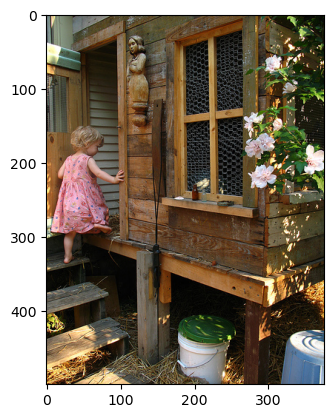

In [125]:
generate_caption("1000268201_693b08cb0e.jpg")

In [123]:
from sklearn.cluster import KMeans
def predict_caption(model, image, tokenizer, max_length):
    # add start tag for generation process
    in_text = 'startseq'
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([image, sequence], verbose=0)
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        word = idx_to_word(yhat, tokenizer)
        # stop if word not found
        if word is None:
            break
        # append word as input for generating next word
        in_text += " " + word
        # stop if we reach end tag
        if word == 'endseq':
            break
        color_tags = get_color_tags(image)
        if color_tags:
            # append the color tags to the input sequence
            in_text += " " + " ".join(color_tags)
      
    return in_text
def get_color_tags(image):
    if image.ndim == 2:
        # repeat the grayscale channel to create an RGB image
        image = np.repeat(image[:, :, np.newaxis], 3, axis=2)

    # get the dominant colors in the image using k-means clustering
    k = 3 # number of dominant colors to extract
    pixels = np.reshape(image, (image.shape[0] * image.shape[1], 3))
    kmeans = KMeans(n_clusters=k).fit(pixels)
    colors = kmeans.cluster_centers_
    # convert the RGB values to hexadecimal strings
    hex_colors = [rgb_to_hex(color) for color in colors]
    return hex_colors

def rgb_to_hex(rgb):
    r, g, b = rgb
    hex_color = "#{:02x}{:02x}{:02x}".format(int(r), int(g), int(b))
    return hex_color

def load_image(image):
    # load the image using PIL library
    image = Image.open(image)
    # resize the image to match the input size of the model
    image = image.resize((224, 224))
    # convert the image to a numpy array
    image = np.asarray(image)
    # normalize the pixel values to the range [0, 1]
    image = image.astype('float32') / 255.0
    # reshape the array to match the input shape of the model
    image = np.expand_dims(image, axis=0)
    return image

---------------------Actual---------------------
startseq child in pink dress is climbing up set of stairs in an entry way endseq
startseq girl going into wooden building endseq
startseq little girl climbing into wooden playhouse endseq
startseq little girl climbing the stairs to her playhouse endseq
startseq little girl in pink dress going into wooden cabin endseq
--------------------Predicted--------------------
startseq woman #000000 #010101 #040404 in #000000 #040404 #010101 blue #000000 #010101 #040404 hat #010101 #000000 #040404 is #010101 #000000 #040404 sitting #010101 #000000 #040404 on #010101 #040404 #000000 wooden #000000 #040404 #010101 bench #000000 #040404 #010101 at #040404 #000000 #010101 table #000000 #040404 #010101 endseq


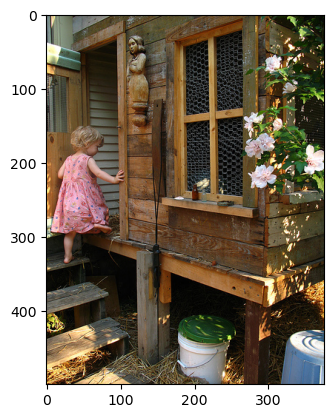

In [124]:
generate_caption("1000268201_693b08cb0e.jpg")

In [77]:
vgg_model = VGG16()
# restructure the model
vgg_model = Model(inputs=vgg_model.inputs, outputs=vgg_model.layers[-2].output)

In [79]:
image_path = "C:/Users/hp/Downloads/girlsample1.jpg"
# load image
image = load_img(image_path, target_size=(224, 224))
# convert image pixels to numpy array
image = img_to_array(image)
# reshape data for model
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
# preprocess image for vgg
image = preprocess_input(image)
# extract features
feature = vgg_model.predict(image, verbose=0)
# predict from the trained model
predict_caption(model, feature, tokenizer, max_length)

'startseq man in blue shorts and hat is standing on the edge of rocks endseq'